# Pulling picture metadata from in-image header - Create a dictionary of each character used.

### The problem:

Valuable information such as **temperature** and **exposure** are stored in a 'header' which is burned into the top left of many of the phenocam photos.  While it is important that this information was captured, the format is not at all convienent for use in a automated process.  We need to use some form of photo-processing to convert this from a collection of pixels to a string or number that can be used convienently.  

This task is complicated by the fact that the shape of the 'header' differs from photo to photo for an individual site, has a translucency that complicates straight color look-ups, has a different format (number and layout of lines) from site to site, is not found for all sites, and is located on a background that varies from site to site and image to image. 

The process that I'm using to convert this infomation involves the following steps:
<ol>
<li>Extract out the maximum region this header could cover.  I'm using the top left 850 by 83 pixels.</li>
<li>Split this into the individual lines based on explicit rows.</li>
<ol>
<li>Line1= rows 0 to 27</li>
<li>Line2= rows 28 to 55</li>
<li>Line3= rows 56 to 83</li>
<li>Some sites have four lines but this is not currently handled</li>
</ol>
<li>Rescale the exposure of each of these line areas to use the entire range (per band).</li>
<li>Identify possible edges using a sobel filter.</li>
<li>Extract out the text box using the sobel edges.  Basically remove the trailing right sky or background area of each line, or if that doesn't work use a default</li>
<li>Convert the color of each line into a binary image using a local otsu filter</li>
<li>Label each discreate region of each binary image. If everything works these are clean character shapes</li>
<li>Match the shape of each of these labeled images with a known shape to identify the characters.</li>
</ol>

The purpose of this code is to generate the dictionary of character to shape that will be used to lookup the character in that last step.

### The code in this notebook was used to generate the lookup dictionary of character patterns used in the pyphenocam python package

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append(r"..")

import pyphenocam

In [3]:
quickbird = pyphenocam.dataaccess.get_site('quickbird')

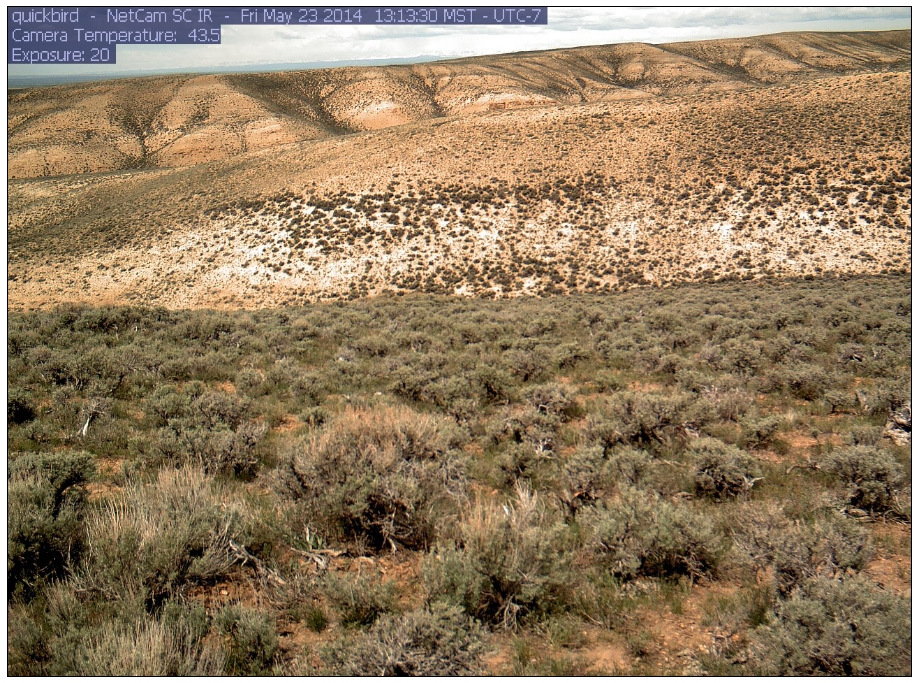

In [4]:
%matplotlib inline
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = quickbird.get_local_image_fname(quickbird.midday_fnames[0])
ax.imshow(quickbird.get_local_image(quickbird.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

## There's a function in pyphenocam to convert this from the embedded pixels into a string:

In [5]:
pyphenocam.headerextraction.get_header_contents(quickbird.get_local_image_fname(quickbird.midday_fnames[0]))

{'line1': 'quickbird-NetCamSCIR-FriMay23201413:13:30MST-UTC-7',
 'line2': 'CameraTemperature:43.5',
 'line3': 'Exposure:20',
 'line4': ''}

### Or if we just want the exposure:

In [6]:
pyphenocam.headerextraction.get_exposure(quickbird.get_local_image_fname(quickbird.midday_fnames[0]))

'20'

#### other information will need to be parsed from the raw lines strings  
This isn't going to work for all site's and all photos, but it is robust across nearly all photos from sites that have standard header size and location info. 

## The remainder of this notebook was used to create the font lookup dictionary used in the pyphenocam package. 

In [7]:
line1_ans = 'quickbird-NetCamSCIR-FriMay23201413:13:30MST-UTC-7'
line2_ans = 'CameraTemperature:43.5'
line3_ans = 'Exposure:20'

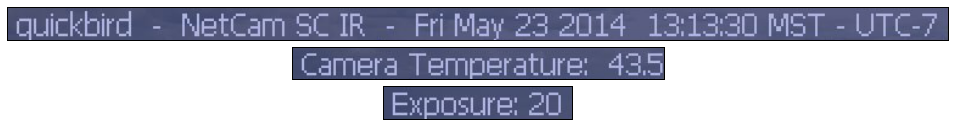

In [8]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [9]:
digit_dict = {}

for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

# 1st Harvard photo

In [10]:
harvard = pyphenocam.dataaccess.get_site('harvard')

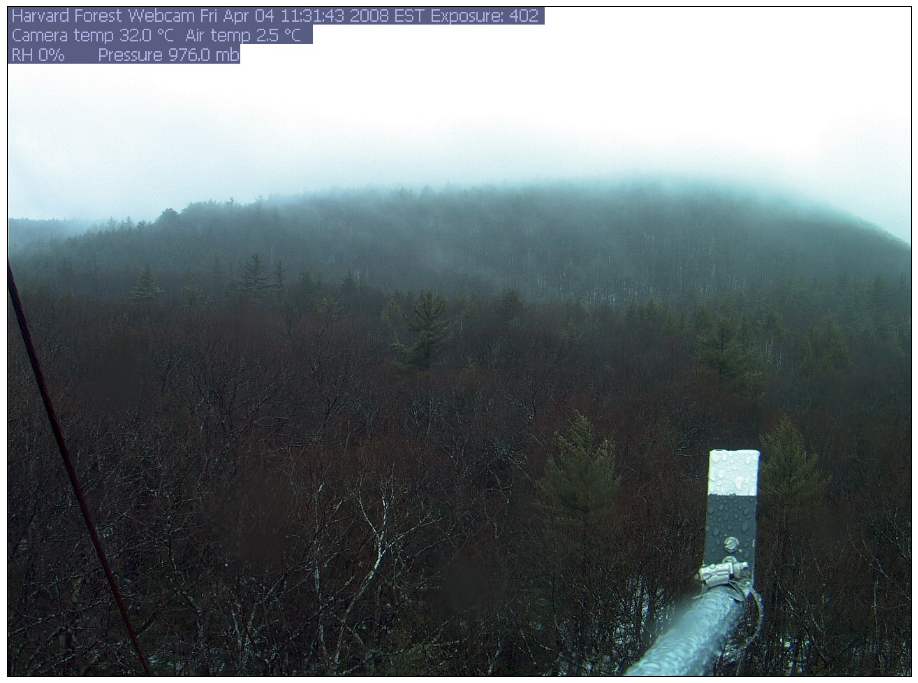

In [11]:
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = harvard.get_local_image_fname(harvard.midday_fnames[0])
ax.imshow(harvard.get_local_image(harvard.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

In [12]:
line1_ans = 'HarvardForestWebcamFriApr0411:31:432008ESTExposure:402'
line2_ans = u'Cameratemp32.0°CAirtemp2.5°C'
line3_ans = 'RH0%Pressure976.0mb'

In [13]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)

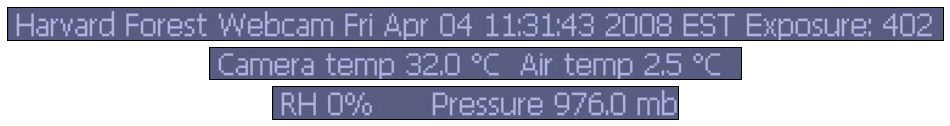

In [14]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [15]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
#         print digit_label, answer
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)
    print '\n'

In [16]:
#these characters are still missing from the dictionary
import string
for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower,

f g h j l n w z


# 1st freemanggrass

In [17]:
freemanggrass = pyphenocam.dataaccess.get_site('freemangrass')

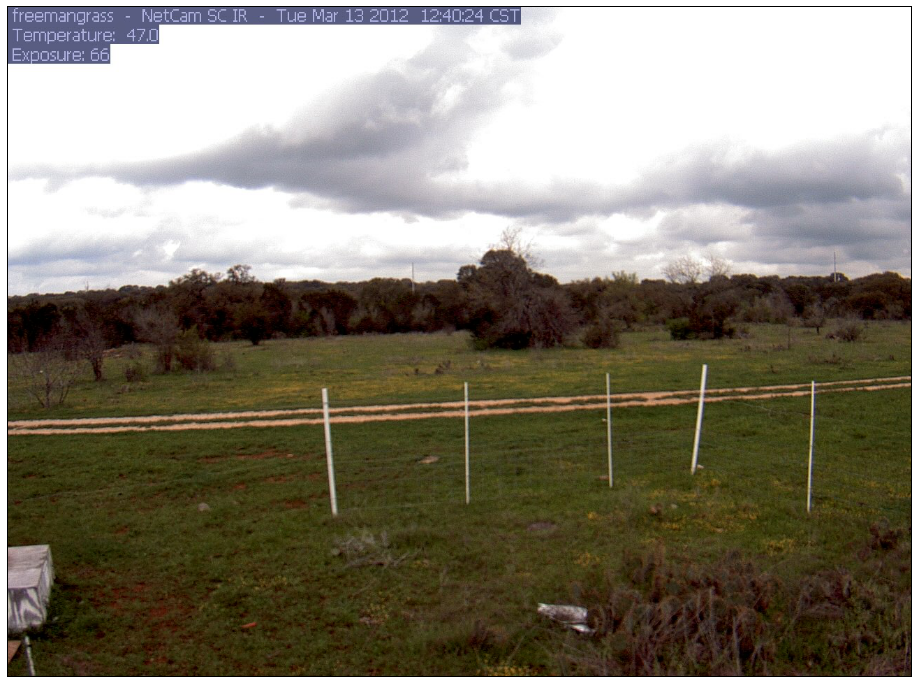

In [18]:
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = freemanggrass.get_local_image_fname(freemanggrass.midday_fnames[0])
ax.imshow(freemanggrass.get_local_image(freemanggrass.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

In [19]:
line1_ans = 'freemangrass-NetCamSCIR-TueMar13201212:40:24CST'
line2_ans = 'Temperature:47.0'
line3_ans = 'Exposure:66'

In [20]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)

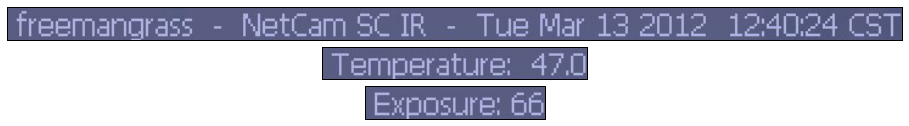

In [21]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [22]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

In [23]:
for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower

h
j
l
w
z


# 1st humnokericea photo

In [24]:
humnokericea = pyphenocam.dataaccess.get_site('humnokericea')

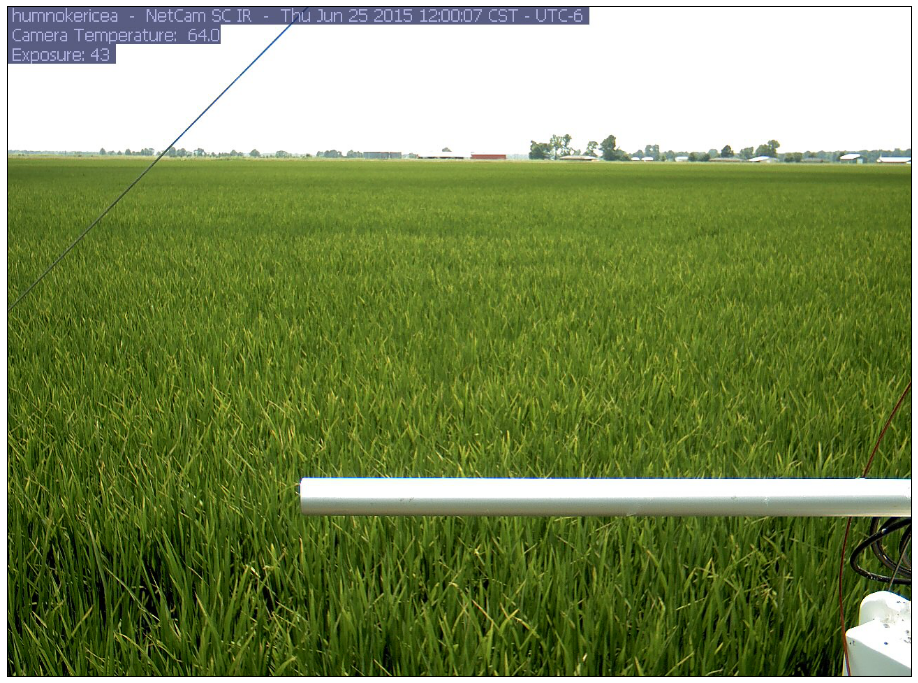

In [25]:
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = humnokericea.get_local_image_fname(humnokericea.midday_fnames[0])
ax.imshow(humnokericea.get_local_image(humnokericea.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

In [26]:
line1_ans = 'humnokericea-NetCamSCIR-ThuJun25201512:00:07CST-UTC-6'
line2_ans = 'CameraTemperature:64.0'
line3_ans = 'Exposure:43'

In [27]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)

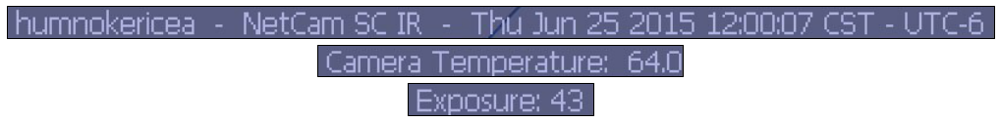

In [28]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [29]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

In [30]:
for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower

j
l
w
z


# 1st jasperrridge

In [31]:
jasperridge = pyphenocam.dataaccess.get_site('jasperridge')

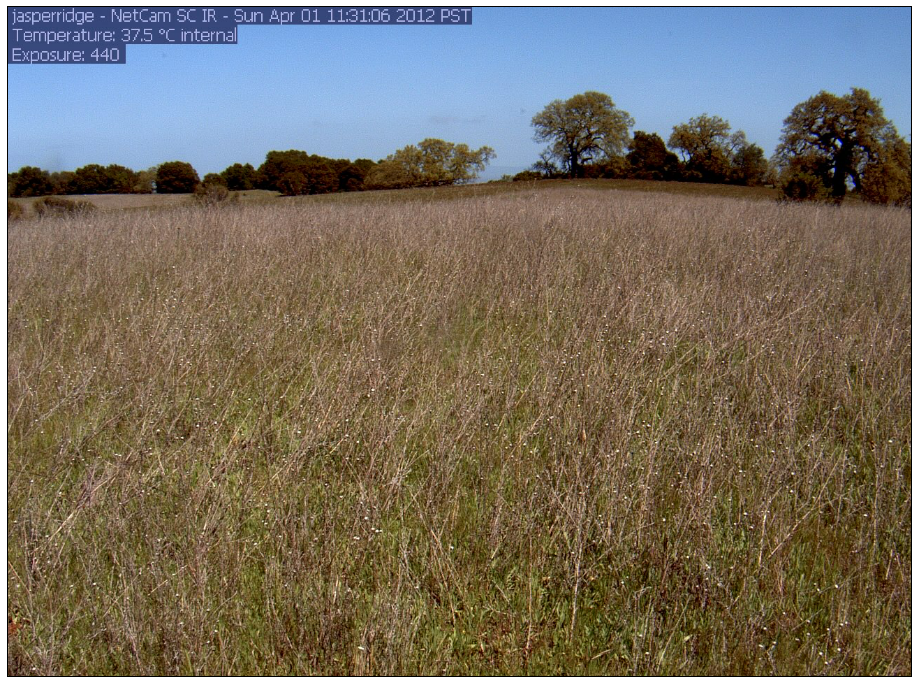

In [32]:
fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = jasperridge.get_local_image_fname(jasperridge.midday_fnames[0])
ax.imshow(jasperridge.get_local_image(jasperridge.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

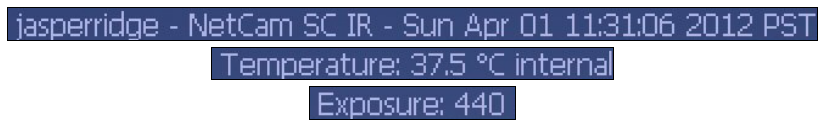

In [33]:
line1_ans = 'jasperridge-NetCamSCIR-SunApr0111:31:062012PST'
line2_ans = u'Temperature:37.5°Cinternal'
line3_ans = 'Exposure:440'

line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [34]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower

w
z


# sweetbriar

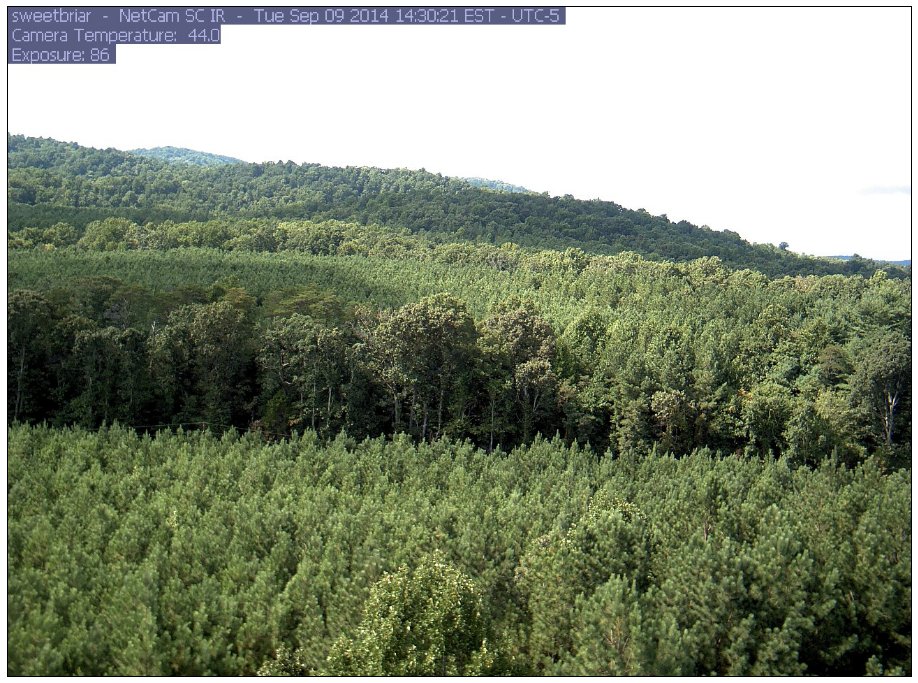

In [35]:
sweetbriar = pyphenocam.dataaccess.get_site('sweetbriar')

fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = sweetbriar.get_local_image_fname(sweetbriar.midday_fnames[0])
ax.imshow(sweetbriar.get_local_image(sweetbriar.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

In [36]:
line1_ans = 'sweetbriar-NetCamSCIR-TueSep09201412:30:21EST-UTC-5'
line2_ans = 'CameraTemperature:44.0'
line3_ans = 'Exposure:86'

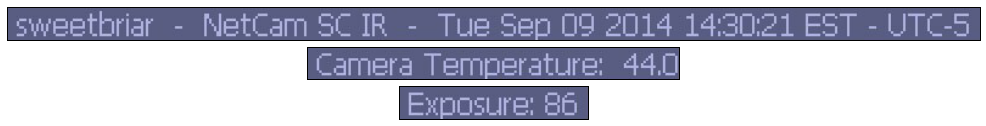

In [37]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [38]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower

z


# bozeman

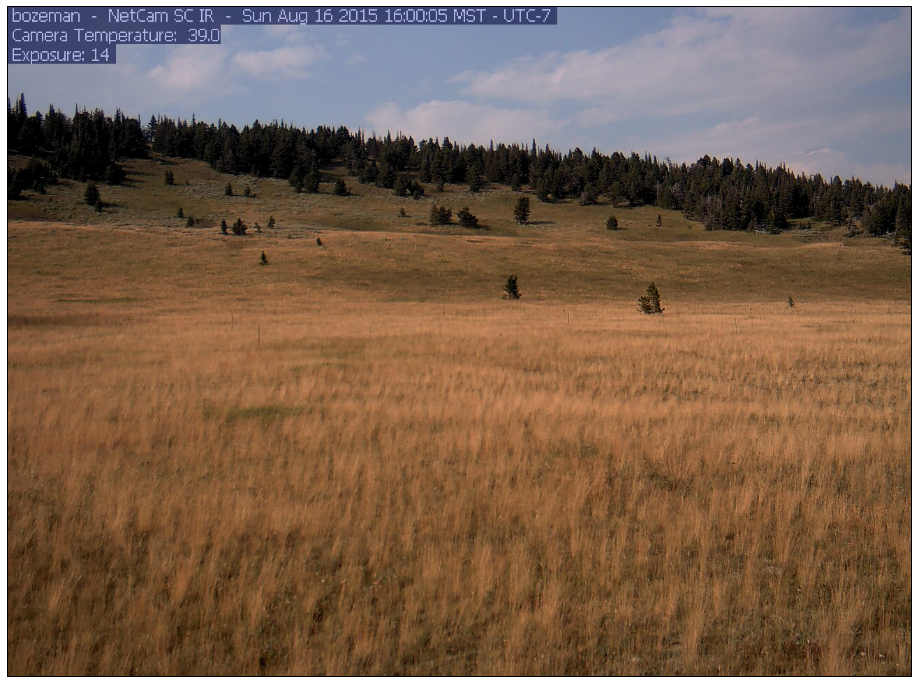

In [39]:
bozeman = pyphenocam.dataaccess.get_site('bozeman')

fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
local_fname = bozeman.get_local_image_fname(bozeman.midday_fnames[0])
ax.imshow(bozeman.get_local_image(bozeman.midday_fnames[0]))

pyphenocam.plotting.format_photo_axes(ax)

In [40]:
line1_ans = 'bozeman-NetCamSCIR-SunAug16201516:00:05MST-UTC-7'
line2_ans = 'CameraTemperature:39.0'
line3_ans = 'Exposure:14'

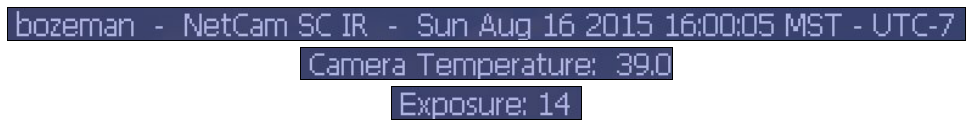

In [41]:
line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(18,2))
ax1.imshow(line1)
ax2.imshow(line2)
ax3.imshow(line3)
pyphenocam.plotting.photo_format(fig)

In [42]:
for line_photo, line_ans in zip([line1, line2, line3], 
                                [line1_ans, line2_ans, line3_ans]):
    line_binary = pyphenocam.headerextraction._get_binary(line_photo)
    digit_labels, labeled_image = pyphenocam.headerextraction._segment(line_binary)
    
    for digit_label, answer in zip(reversed(digit_labels), reversed(line_ans)):
        digit_dict[answer] =pyphenocam.headerextraction._get_digit(line_binary, labeled_image, digit_label)

for lower in string.ascii_lowercase:
    if lower not in digit_dict.keys():
        print lower

# Check our work 

<function __main__.show_digit>

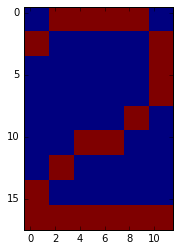

In [43]:
from IPython.display import display
from IPython.html.widgets import *

def show_digit(digit):
    plt.imshow(digit_dict[str(digit)], interpolation='nearest')

w = widgets.Dropdown(
    options=digit_dict.keys(),
    value='2',
    description='Number:',
)
interact(show_digit, digit=w)

In [44]:
import pickle

outfname = r"..\pyphenocam\data\DIGITDICT_FULL.p"
pickle.dump(digit_dict, open( outfname, "wb" ) )

## There are a few capital letters that did not make it into our lookup dictionary but that's probably ok for now

In [45]:
for upper in string.ascii_uppercase:
    if upper not in digit_dict.keys():
        print upper,

B D G K L O Q V X Y Z


# Try it out on a new site and a random photo

In [46]:
sitenames = pyphenocam.dataaccess.get_sitenames()

Random site:  proctor
UMProctorMapleResCtrFrict2311:46:482009ESTExposure:18




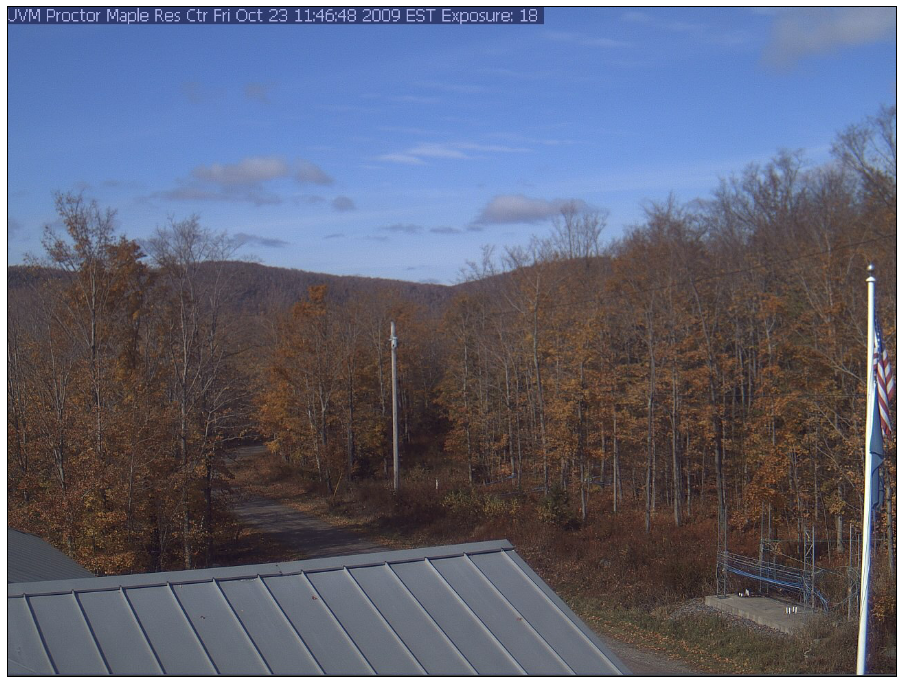

In [47]:
import random

random_sitename = random.choice(sitenames)
random_site = pyphenocam.dataaccess.get_site(random_sitename)
print "Random site: ", random_sitename

fig = plt.figure(figsize=(18, 12))
ax = fig.add_subplot(111)
random_fname = random.choice(random_site.midday_fnames)
local_fname = random_site.get_local_image_fname(random_fname)
ax.imshow(random_site.get_local_image(random_fname))

pyphenocam.plotting.format_photo_axes(ax)

line1, line2, line3, line4 = pyphenocam.headerextraction._get_lines(local_fname)
for line in [line1, line2, line3]:
    line_binary = pyphenocam.headerextraction._get_binary(line)
    print pyphenocam.headerextraction._extract_digits(line_binary)